In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [3]:
df=pd.read_csv('data.csv')
#df.head()
#df.columns
#df.shape #569*33
df.info()  #no missing value 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 33 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   id                       569 non-null    int64  
 1   diagnosis                569 non-null    object 
 2   radius_mean              569 non-null    float64
 3   texture_mean             569 non-null    float64
 4   perimeter_mean           569 non-null    float64
 5   area_mean                569 non-null    float64
 6   smoothness_mean          569 non-null    float64
 7   compactness_mean         569 non-null    float64
 8   concavity_mean           569 non-null    float64
 9   concave points_mean      569 non-null    float64
 10  symmetry_mean            569 non-null    float64
 11  fractal_dimension_mean   569 non-null    float64
 12  radius_se                569 non-null    float64
 13  texture_se               569 non-null    float64
 14  perimeter_se             5

In [4]:
df.groupby('diagnosis').size() #Diagnosis class distribution: 357 benign, 212 malignant

diagnosis
B    357
M    212
dtype: int64

## Exploratory Data Analysis (EDA)


#### Drop unnecessary columns
Get rid of "id" and "Unnamed: 32" features since they are irrelevant to diagnose breast cancer

In [5]:
df.drop(["Unnamed: 32","id"],axis=1,inplace=True)
df.head()

,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,...,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


#### 2.2 Descriptive Analysis
**check decriptive statistics for features**

In [6]:
df.describe()

,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
count,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,...,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000
mean,14.127292,19.289649,91.969033,654.889104,0.096360,0.104341,0.088799,0.048919,0.181162,0.062798,...,16.269190,25.677223,107.261213,880.583128,0.132369,0.254265,0.272188,0.114606,0.290076,0.083946
std,3.524049,4.301036,24.298981,351.914129,0.014064,0.052813,0.079720,0.038803,0.027414,0.007060,...,4.833242,6.146258,33.602542,569.356993,0.022832,0.157336,0.208624,0.065732,0.061867,0.018061
min,6.981000,9.710000,43.790000,143.500000,0.052630,0.019380,0.000000,0.000000,0.106000,0.049960,...,7.930000,12.020000,50.410000,185.200000,0.071170,0.027290,0.000000,0.000000,0.156500,0.055040
25%,11.700000,16.170000,75.170000,420.300000,0.086370,0.064920,0.029560,0.020310,0.161900,0.057700,...,13.010000,21.080000,84.110000,515.300000,0.116600,0.147200,0.114500,0.064930,0.250400,0.071460
50%,13.370000,18.840000,86.240000,551.100000,0.095870,0.092630,0.061540,0.033500,0.179200,0.061540,...,14.970000,25.410000,97.660000,686.500000,0.131300,0.211900,0.226700,0.099930,0.282200,0.080040
75%,15.780000,21.800000,104.100000,782.700000,0.105300,0.130400,0.130700,0.074000,0.195700,0.066120,...,18.790000,29.720000,125.400000,1084.000000,0.146000,0.339100,0.382900,0.161400,0.317900,0.092080
max,28.110000,39.280000,188.500000,2501.000000,0.163400,0.345400,0.426800,0.201200,0.304000,0.097440,...,36.040000,49.540000,251.200000,4254.000000,0.222600,1.058000,1.252000,0.291000,0.663800,0.207500


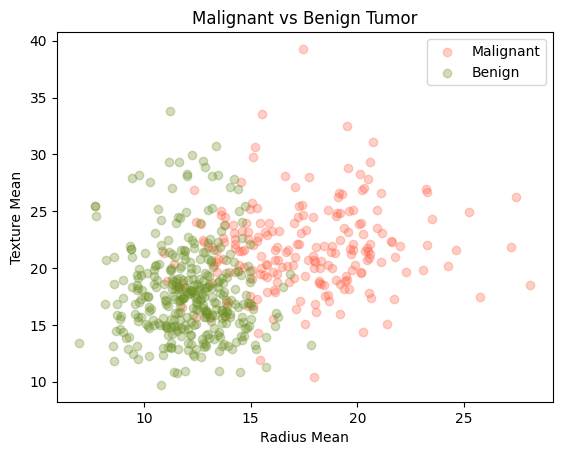

In [7]:
#plot outcome variable to see whether suitable for KNN Algorithm or not
M = df[df.diagnosis == "M"]
B = df[df.diagnosis == "B"]
plt.title("Malignant vs Benign Tumor")
plt.xlabel("Radius Mean")
plt.ylabel("Texture Mean")
plt.scatter(M.radius_mean, M.texture_mean, color = "tomato", label = "Malignant", alpha = 0.3)
plt.scatter(B.radius_mean, B.texture_mean, color = "olivedrab", label = "Benign", alpha = 0.3)
plt.legend()
plt.show()

**Convert the diagnosis label from M and B to a dummy variable**
* M (Malignant) = 1
* B (Benign) = 0


In [8]:
df['diagnosis']=np.where(df['diagnosis']=='M',1,0)  

In [9]:
#df.info() #'diagnosis' has changed to int64
df.describe()

,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
count,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,...,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000
mean,0.372583,14.127292,19.289649,91.969033,654.889104,0.096360,0.104341,0.088799,0.048919,0.181162,...,16.269190,25.677223,107.261213,880.583128,0.132369,0.254265,0.272188,0.114606,0.290076,0.083946
std,0.483918,3.524049,4.301036,24.298981,351.914129,0.014064,0.052813,0.079720,0.038803,0.027414,...,4.833242,6.146258,33.602542,569.356993,0.022832,0.157336,0.208624,0.065732,0.061867,0.018061
min,0.000000,6.981000,9.710000,43.790000,143.500000,0.052630,0.019380,0.000000,0.000000,0.106000,...,7.930000,12.020000,50.410000,185.200000,0.071170,0.027290,0.000000,0.000000,0.156500,0.055040
25%,0.000000,11.700000,16.170000,75.170000,420.300000,0.086370,0.064920,0.029560,0.020310,0.161900,...,13.010000,21.080000,84.110000,515.300000,0.116600,0.147200,0.114500,0.064930,0.250400,0.071460
50%,0.000000,13.370000,18.840000,86.240000,551.100000,0.095870,0.092630,0.061540,0.033500,0.179200,...,14.970000,25.410000,97.660000,686.500000,0.131300,0.211900,0.226700,0.099930,0.282200,0.080040
75%,1.000000,15.780000,21.800000,104.100000,782.700000,0.105300,0.130400,0.130700,0.074000,0.195700,...,18.790000,29.720000,125.400000,1084.000000,0.146000,0.339100,0.382900,0.161400,0.317900,0.092080
max,1.000000,28.110000,39.280000,188.500000,2501.000000,0.163400,0.345400,0.426800,0.201200,0.304000,...,36.040000,49.540000,251.200000,4254.000000,0.222600,1.058000,1.252000,0.291000,0.663800,0.207500


**Check relationship between features and outcome variable**
* **1.scatter plot**
* According to the plots on the first row, M and B observations are clearly seperated out in terms of these features, suggesting these features are good predictors that we should put into the model later on.

In [10]:
#df_plot=df[['radius_mean','texture_mean','perimeter_mean','area_mean','smoothness_mean','compactness_mean','diagnosis']]
sns.set_style("whitegrid")
g=sns.PairGrid(df,hue='diagnosis')
g.map_offdiag(plt.scatter)  
g.add_legend()
plt.show()

* **2.correlation of coefficients**
* First row suggests moderate or strong relationship between diagnosis label and other features

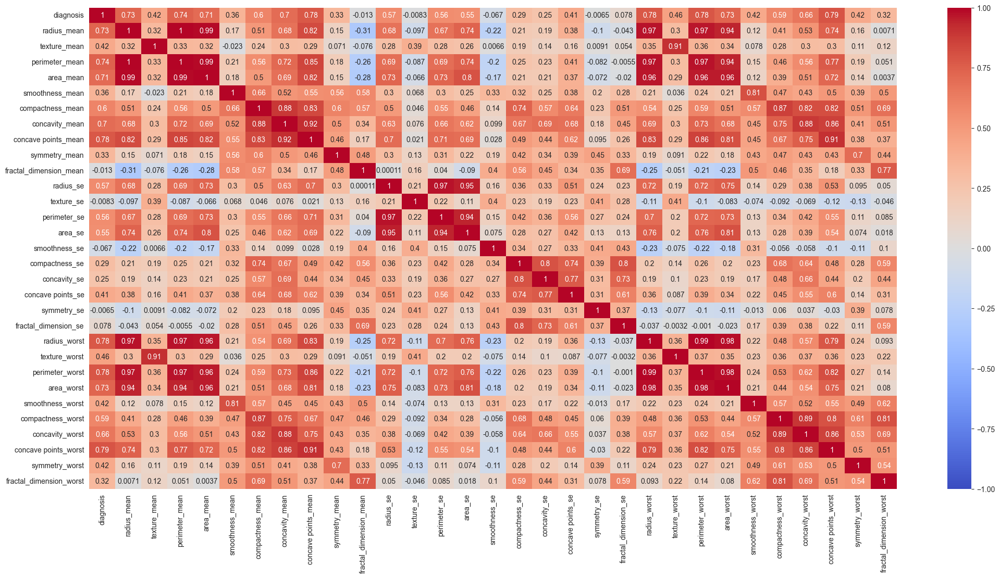

In [11]:
#df.corr()
#plot correlation heatmap
plt.figure(figsize=(25, 12))
sns.heatmap(df.corr(), vmin = -1, vmax = 1, center = 0, cmap = 'coolwarm', annot = True)
plt.show()

## 3. Build model - KNN model from Scikit-learn 

### Meaning of KNN Algorithm
* Classify the label of a data point by looking at the 'K' nearest labeled data points
* Taking the majority votes
* :) high accuracy, insensitive to outliers
* :( computationally heavy
* only one parameter: n_neighors - 'K'
* Train the model(Training dataset): .fit()    
* Predict of new data (Testing dataset): .predict()

In [12]:
#split the data into features X and label Y 
#df.info()
X=df.iloc[:,1:30]
Y=df.iloc[:,0]

### 3.1 Manually select 3 records as test dataset 

In [13]:
#select 3 data for prediction 
X_new=X.iloc[200:203]  
Y_new=Y.iloc[200:203]

#KNN 
from sklearn.neighbors import KNeighborsClassifier
knn1 = KNeighborsClassifier(n_neighbors=3)
knn1.fit(X,Y) 
Y_predict1=knn1.predict(X_new) 

print('Prediction Result:{}'.format(Y_predict1))
print('Actual Result:{}'.format(Y_new))

Prediction Result:[0 1 1]
Actual Result:200    0
201    1
202    1
Name: diagnosis, dtype: int32


### 3.2 Train/Test Split and Performance Metrics 
* *train_test_split*: helps to split the data for training and testing
* Default Performance Metrics in Scikit-learn for KNN: **accuracy** 
* **accuracy=correct prediction/total no. of prediction**

In [14]:
from sklearn.model_selection import train_test_split 
X_train, X_test, Y_train, Y_test=train_test_split(X,Y,test_size=0.2,random_state=1)  

knn2=KNeighborsClassifier(n_neighbors=3)
knn2.fit(X_train,Y_train)

Y_predict2=knn2.predict(X_test)
print("Test set predictions:{}".format(Y_predict2))

Test set predictions:[0 1 0 1 1 1 1 1 0 0 0 0 1 0 0 0 0 0 0 1 0 0 1 0 1 0 1 1 1 1 1 0 1 0 0 0 1
 0 0 0 0 0 0 0 0 1 0 0 0 1 1 1 0 0 0 0 0 1 0 0 0 1 0 1 0 0 0 1 0 0 0 0 1 1
 0 1 0 0 0 1 0 1 0 1 0 0 1 0 1 0 0 1 0 0 1 1 0 0 0 0 0 0 0 0 1 0 0 0 1 1 0
 0 0 0]


In [15]:
#Evaluation: accuracy
knn2.score(X_test, Y_test) 

0.9210526315789473

### 3.3 K-Fold Cross_Validation
* Model performance is dependent on way the data is split
* Not representative of the model's ability to generalize 用test_size去分出test set
* **Solution: Cross-validation** 
* cv= no. of groups that a given data sample is to be split into
* :) Reflect the true performance of a model
* :( more folds, more computationally expensive

In [16]:
from sklearn.model_selection import cross_val_score
knn=KNeighborsClassifier(n_neighbors=3)
cv_results=cross_val_score(knn, X, Y, cv=5)  
print(cv_results)

[0.87719298 0.92105263 0.94736842 0.93859649 0.91150442]


In [17]:
#Evaluation:The average accuracy rate of 5 test-train groups
print("The average accuracy rate is:{}".format(np.mean(cv_results)))

The average accuracy rate is:0.9191429902189101


## 4. Hyperparameter Tuning: Find out the optimal k
* k-Nearest Neighbors: choosing optimal n_neighbors
* Hyperparameters cannot be learned by fitting the model
* **Solution1: GridSearchCV**
* **Solution2: RandomizedSearch**

In [18]:
from sklearn.model_selection import GridSearchCV
param_grid={'n_neighbors':np.arange(1,50)}   
knn=KNeighborsClassifier()  
knn_best_k=GridSearchCV(knn, param_grid, cv=5) 

knn_best_k.fit(X,Y)

GridSearchCV(cv=5, estimator=KNeighborsClassifier(),
             param_grid={'n_neighbors': array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34,
       35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49])})

In [19]:
knn_best_k.best_params_
print("Best parameter:",knn_best_k.best_params_)

Best parameter: {'n_neighbors': 14}


In [20]:
#the accuracy rate for the best k 
knn_best_k.best_score_
print("Best score:",knn_best_k.best_score_)

Best score: 0.935010091600683


## 5. Classification Performance Metrics - Another way to evaluate the model: Confusion Matrix
* Acurracy is not always a useful metric
* If 99% of cancer are Malignant; 1% of cancer are Bengign,could build a classifier that predicts ALL cancer as Malignant - 99% accurate!
* :( But horrible at actually classifying Benign cancer
* :( Fails at its original purpose
* **Solution: Confusion Matrix**
* F1score=2*(precision x recall)/(precision+recall)

In [21]:
#cross validation with confusion matrix
from sklearn.metrics import confusion_matrix 
knn=KNeighborsClassifier(n_neighbors=14) #use the best k we computed above
X_train, X_test, Y_train, Y_test = train_test_split(X,Y,test_size=0.2,random_state=1) 
knn.fit(X_train,Y_train)
Y_predict3=knn.predict(X_test)
print(confusion_matrix(Y_test,Y_predict3))

[[71  1]
 [ 8 34]]


In [22]:
from sklearn.metrics import classification_report
knn=KNeighborsClassifier(n_neighbors=14)
X_train, X_test, Y_train, Y_test = train_test_split(X,Y,test_size=0.2,random_state=1) 
knn.fit(X_train,Y_train)
Y_predict3=knn.predict(X_test)
print(classification_report(Y_test,Y_predict3))

              precision    recall  f1-score   support

           0       0.90      0.99      0.94        72
           1       0.97      0.81      0.88        42

    accuracy                           0.92       114
   macro avg       0.94      0.90      0.91       114
weighted avg       0.93      0.92      0.92       114



**Overall, with n_neighbors of 14, our KNN model gives the most accurate classifcation results.**